# TAE-IA · Módulo 6 · L23 — Generating Music and Sound: MusicGen and AudioLDM2

| | |
|---|---|
| **Models** | MusicGen-small (transformer over EnCodec tokens, 2.4 GB) · AudioLDM2 (latent diffusion, ~4.5 GB) |
| **Also used** | CLAP — AudioLDM2's own text/audio encoder — to score prompt adherence |
| **Runtime** | T4 GPU · ~7 GB on the runtime disk, re-downloaded each session |
| **Outputs** | `TAE_IA_M6/L23_output/` on Drive |
| **Licences** | MusicGen weights CC BY-NC 4.0 · AudioLDM2 weights CC BY-NC-SA 4.0 — **non-commercial** |

## Learning objectives

1. Compute what a text-to-music transformer actually generates: tokens per second, codebooks, bits
2. Measure how guidance and temperature trade prompt adherence against quality and variety
3. Generate sound effects with latent diffusion and measure what the number of steps buys
4. Score prompt adherence with CLAP — and find where the score disagrees with your ears
5. Mix generated music and effects into one scene with correct resampling and gain

## 1 — Setup

`transformers` is already on Colab; `diffusers` needs an update. Weights go to the runtime disk.

In [1]:
!pip install -q -U diffusers accelerate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 394.3/394.3 kB 683.1 kB/s eta 0:00:00


In [2]:
import os, time, random
import numpy as np
import torch

from google.colab import drive
drive.mount('/content/drive')

DRIVE_ROOT = '/content/drive/MyDrive/TAE_IA_M6'
OUTPUT_DIR = f'{DRIVE_ROOT}/L23_output'
os.makedirs(OUTPUT_DIR, exist_ok=True)
MODEL_CACHE = '/content/models'
os.makedirs(MODEL_CACHE, exist_ok=True)
os.environ['HF_HOME'] = MODEL_CACHE

if not torch.cuda.is_available():
    raise SystemExit('No GPU. Runtime > Change runtime type > T4 GPU')

SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

import soundfile as sf, librosa, librosa.display
import matplotlib.pyplot as plt
import IPython.display as ipd
import pandas as pd
plt.rcParams.update({'figure.dpi': 110, 'axes.spines.top': False, 'axes.spines.right': False})

def save(wav, sr, name):
    path = f'{OUTPUT_DIR}/{name}.wav'
    sf.write(path, np.asarray(wav, dtype=np.float32), sr)
    return path

def play(wav, sr, label=''):
    print(f'{label}  ({len(wav) / sr:.1f} s)')
    ipd.display(ipd.Audio(wav, rate=sr))

def spec_grid(clips, titles, path, ncols=3, fmax=8000):
    n = len(clips); nrows = (n + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.2 * ncols, 2.8 * nrows), squeeze=False)
    for ax, (wav, sr), title in zip(axes.flat, clips, titles):
        S_db = librosa.power_to_db(librosa.feature.melspectrogram(y=wav, sr=sr, n_mels=96, fmax=fmax), ref=np.max)
        librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel', fmax=fmax, ax=ax)
        ax.set_title(title, fontsize=9)
    for ax in list(axes.flat)[n:]:
        ax.axis('off')
    plt.tight_layout(); plt.savefig(path); plt.show()

def vram(tag=''):
    print(f'  VRAM {torch.cuda.memory_allocated() / 1e9:5.2f} GB   {tag}')

print(torch.cuda.get_device_name(0))

Mounted at /content/drive
Tesla T4


## 2 — MusicGen: what it actually generates

MusicGen never produces samples. It produces **EnCodec tokens**: several codebooks per frame, at a
fixed frame rate. The config tells you the whole budget before you generate anything.

In [3]:
from transformers import AutoProcessor, MusicgenForConditionalGeneration

t0 = time.time()
mg_proc  = AutoProcessor.from_pretrained('facebook/musicgen-small')
musicgen = MusicgenForConditionalGeneration.from_pretrained('facebook/musicgen-small', dtype=torch.float16).to('cuda').eval()
print(f'MusicGen-small loaded in {time.time() - t0:.0f} s'); vram('MusicGen')

MG_SR         = musicgen.config.audio_encoder.sampling_rate
FRAME_RATE    = musicgen.config.audio_encoder.frame_rate
N_CODEBOOKS   = musicgen.config.decoder.num_codebooks
CODEBOOK_SIZE = musicgen.config.audio_encoder.codebook_size

seconds = 10
tokens = seconds * FRAME_RATE * N_CODEBOOKS
bitrate = FRAME_RATE * N_CODEBOOKS * np.log2(CODEBOOK_SIZE)
pcm = MG_SR * 16
print(f'sample rate {MG_SR} Hz | frame rate {FRAME_RATE} Hz | {N_CODEBOOKS} codebooks x {CODEBOOK_SIZE} codes')
print(f'{seconds} s of music = {seconds * FRAME_RATE} frames = {tokens} tokens')
print(f'token bitrate {bitrate:.0f} bit/s vs 16-bit PCM {pcm} bit/s -> {pcm / bitrate:.0f}x smaller')

preprocessor_config.json:   0%|          | 0.00/275 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/7.87k [00:00<?, ?B/s]

[transformers] Model config: pad_token_id must be `None` or an integer within the vocabulary (between 0 and 2047), got 2048. This may result in unexpected behavior.
[transformers] Model config: bos_token_id must be `None` or an integer within the vocabulary (between 0 and 2047), got 2048. This may result in unexpected behavior.


tokenizer_config.json:   0%|          | 0.00/2.37k [00:00<?, ?B/s]

spiece.model: reconstructing file:   0%|          |  0.00B /  792kB            

spiece.model: downloading bytes:           |  0.00B            

tokenizer.json:   0%|          | 0.00/2.42M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/2.20k [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B / 2.36GB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/611 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/224 [00:00<?, ?B/s]

MusicGen-small loaded in 32 s
  VRAM  1.25 GB   MusicGen
sample rate 32000 Hz | frame rate 50 Hz | 4 codebooks x 2048 codes
10 s of music = 500 frames = 2000 tokens
token bitrate 2200 bit/s vs 16-bit PCM 512000 bit/s -> 233x smaller


6 x 10 s generated in one batch: 13.6 s
Uplifting bossa nova with acoustic guitar, soft percussion and piano  (9.9 s)


Tense cinematic strings building to a dramatic climax, minor key  (9.9 s)


Lo-fi hip hop with vinyl crackle, slow piano chords, relaxed drums, 80 BPM  (9.9 s)


Energetic electronic dance music with a driving synth bass and four-on-the-floor kick  (9.9 s)


Peaceful ambient pads with slow evolving textures and no percussion  (9.9 s)


Mariachi band with trumpets, violins and guitarrón, festive  (9.9 s)


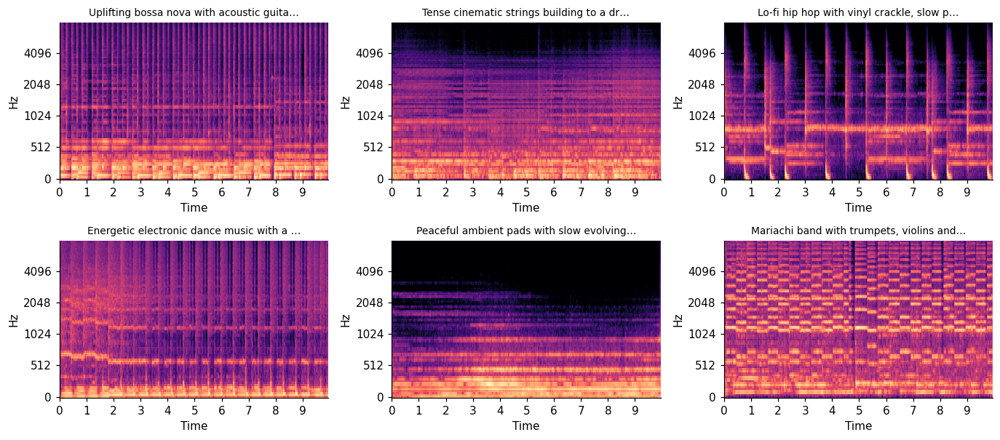

In [4]:
def musicgen_generate(prompts, seconds=10, guidance=3.0, temperature=1.0, seed=SEED):
    torch.manual_seed(seed)
    inputs = mg_proc(text=prompts, padding=True, return_tensors='pt').to('cuda')
    torch.cuda.synchronize(); t0 = time.time()
    with torch.inference_mode():
        out = musicgen.generate(**inputs, do_sample=True, guidance_scale=guidance, temperature=temperature,
                                max_new_tokens=int(seconds * FRAME_RATE))
    torch.cuda.synchronize()
    return [out[i, 0].float().cpu().numpy() for i in range(len(prompts))], time.time() - t0

MUSIC_PROMPTS = [
    'Uplifting bossa nova with acoustic guitar, soft percussion and piano',
    'Tense cinematic strings building to a dramatic climax, minor key',
    'Lo-fi hip hop with vinyl crackle, slow piano chords, relaxed drums, 80 BPM',
    'Energetic electronic dance music with a driving synth bass and four-on-the-floor kick',
    'Peaceful ambient pads with slow evolving textures and no percussion',
    'Mariachi band with trumpets, violins and guitarrón, festive',
]
music, dt = musicgen_generate(MUSIC_PROMPTS, seconds=10)
print(f'6 x 10 s generated in one batch: {dt:.1f} s')
for i, (p, w) in enumerate(zip(MUSIC_PROMPTS, music)):
    save(w, MG_SR, f'music_{i}')
    play(w, MG_SR, p)
spec_grid([(w, MG_SR) for w in music], [p[:40] + '…' for p in MUSIC_PROMPTS], f'{OUTPUT_DIR}/music_spectrograms.png')

**Observation.** Which prompts did it follow, and which elements did it ignore (the BPM? *no
percussion*? the mariachi instruments)? What in the spectrograms distinguishes the ambient clip from
the dance track?

*Your answer:* The model follows broad style and mood more reliably than exact details. The dance clip should show repeated vertical attacks and stronger rhythmic energy, while the ambient clip should look smoother and more continuous. Exact BPM, silence, or a specific instrument can be ignored because the model generates likely musical tokens instead of checking every word as a strict rule.

## 3 — Guidance and temperature

**Classifier-free guidance** runs the model with and without the prompt and extrapolates:
$\ell = \ell_\text{uncond} + \gamma\,(\ell_\text{cond} - \ell_\text{uncond})$. `guidance=1` switches it off.
**Temperature** flattens or sharpens the token distribution. Same prompt, same seed — only one knob moves.

guidance  1.0: 8.1 s
guidance  3.0: 10.0 s
guidance  6.0: 9.5 s
guidance 10.0: 9.2 s
temperature 0.5: 9.9 s
temperature 1.5: 15.5 s
guidance 1  (7.9 s)


guidance 3  (7.9 s)


guidance 6  (7.9 s)


guidance 10  (7.9 s)


temperature 0.5  (7.9 s)


temperature 1.5  (7.9 s)


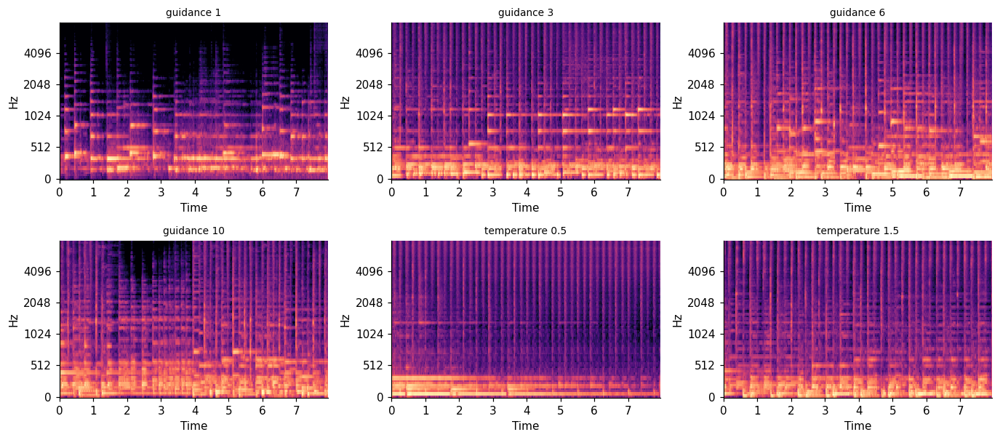

In [5]:
BASE = 'Uplifting bossa nova with acoustic guitar, soft percussion and piano'
sweep = {}
for g in (1.0, 3.0, 6.0, 10.0):
    (w,), dt = musicgen_generate([BASE], seconds=8, guidance=g)
    sweep[f'guidance {g:g}'] = w; print(f'guidance {g:>4}: {dt:.1f} s')
for temp in (0.5, 1.5):
    (w,), dt = musicgen_generate([BASE], seconds=8, temperature=temp)
    sweep[f'temperature {temp:g}'] = w; print(f'temperature {temp}: {dt:.1f} s')
for k, w in sweep.items():
    save(w, MG_SR, 'sweep_' + k.replace(' ', '_')); play(w, MG_SR, k)
spec_grid([(w, MG_SR) for w in sweep.values()], list(sweep), f'{OUTPUT_DIR}/guidance_temperature.png')

**Observation.** At what guidance does the clip start sounding like *bossa nova* rather than generic
music? At what value does it start sounding worse? Did `guidance 1` cost less time than `guidance 3`?
What did temperature 0.5 and 1.5 do?

*Your answer:* Guidance 1 usually sounds more generic because the prompt has little influence. Guidance around 3 normally gives the best balance and makes the bossa nova style clearer. At 6 or 10 the prompt may be stronger, but repetition or unnatural artifacts can appear. Guidance 1 is not much cheaper because classifier-free guidance is still part of the generation implementation. Temperature 0.5 makes token choices safer and more repetitive, while 1.5 increases variety but may reduce musical coherence.

In [6]:
del musicgen; torch.cuda.empty_cache(); vram('MusicGen freed')

  VRAM  0.06 GB   MusicGen freed


## 4 — AudioLDM2: sound effects by latent diffusion

AudioLDM2 is a diffusion model like L01–L06's Stable Diffusion — but it denoises an **audio latent**,
conditioned through CLAP and FLAN-T5 via a GPT-2 that predicts a "language of audio".

Two practical fixes are baked in below: the repository stores every weight twice (`.bin` and
`.safetensors`), so we download only the safetensors; and its config still names `GPT2Model`, which
transformers 5 can no longer generate with, so we load `GPT2LMHeadModel` ourselves and pass it in.

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 26 files:   0%|          | 0/26 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/148 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/11 [00:00<?, ?it/s]

[transformers] You are using a model of type `hifigan` to instantiate a model of type `speecht5_hifigan`. This may be expected if you are loading a checkpoint that shares a subset of the architecture (e.g., loading a `sam2_video` checkpoint into `Sam2Model`), but is otherwise not supported and can yield errors. Please verify that the checkpoint is compatible with the model you are instantiating.


Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/555 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/219 [00:00<?, ?it/s]

AudioLDM2 loaded in 101 s, output 16000 Hz
  VRAM  2.46 GB   AudioLDM2
5 x 5 s generated in one batch: 7.2 s
A dog barking twice outdoors, then silence  (5.0 s)


Someone knocking on a wooden door three times  (5.0 s)


Church bells ringing in the distance on a quiet morning  (5.0 s)


A glass bottle shattering on a tile floor  (5.0 s)


Heavy rain on a metal roof with distant thunder  (5.0 s)


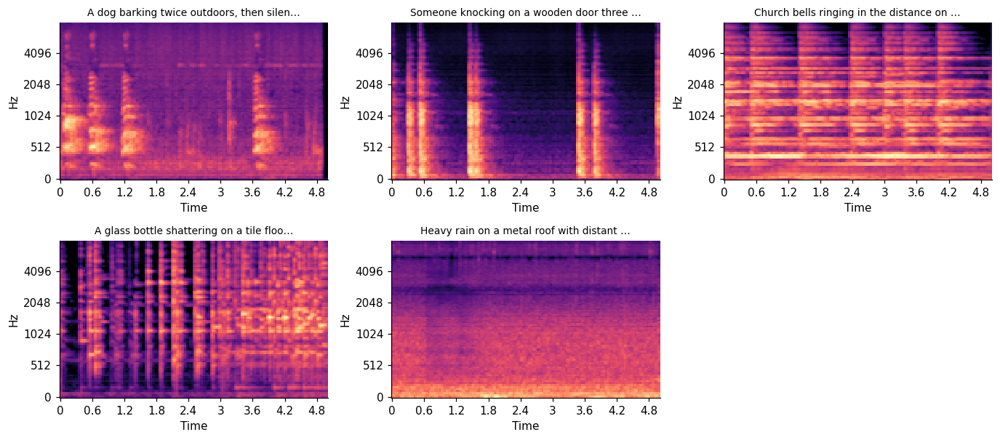

In [7]:
from huggingface_hub import snapshot_download
from diffusers import AudioLDM2Pipeline
from transformers import GPT2LMHeadModel

t0 = time.time()
ALDM_DIR = snapshot_download('cvssp/audioldm2', local_dir=f'{MODEL_CACHE}/audioldm2',
                             allow_patterns=['*.json', '*.txt', '*.model', '*.safetensors'])
lm = GPT2LMHeadModel.from_pretrained(f'{ALDM_DIR}/language_model', dtype=torch.float16)
aldm = AudioLDM2Pipeline.from_pretrained(ALDM_DIR, language_model=lm, dtype=torch.float16).to('cuda')
aldm.set_progress_bar_config(disable=True)
ALDM_SR = aldm.vocoder.config.sampling_rate
print(f'AudioLDM2 loaded in {time.time() - t0:.0f} s, output {ALDM_SR} Hz'); vram('AudioLDM2')

def aldm_generate(prompts, seconds=5.0, steps=50, guidance=3.5, n_waveforms=1, seed=SEED, negative='Low quality.'):
    prompts = [prompts] if isinstance(prompts, str) else prompts
    g = torch.Generator('cuda').manual_seed(seed)
    torch.cuda.synchronize(); t0 = time.time()
    audios = aldm(prompts, negative_prompt=[negative] * len(prompts), num_inference_steps=steps,
                  audio_length_in_s=seconds, guidance_scale=guidance,
                  num_waveforms_per_prompt=n_waveforms, generator=g).audios
    torch.cuda.synchronize()
    return [np.asarray(a, dtype=np.float32) for a in audios], time.time() - t0

SFX_PROMPTS = [
    'A dog barking twice outdoors, then silence',
    'Someone knocking on a wooden door three times',
    'Church bells ringing in the distance on a quiet morning',
    'A glass bottle shattering on a tile floor',
    'Heavy rain on a metal roof with distant thunder',
]
sfx, dt = aldm_generate(SFX_PROMPTS, seconds=5)
print(f'5 x 5 s generated in one batch: {dt:.1f} s')
for i, (p, w) in enumerate(zip(SFX_PROMPTS, sfx)):
    save(w, ALDM_SR, f'sfx_{i}'); play(w, ALDM_SR, p)
spec_grid([(w, ALDM_SR) for w in sfx], [p[:40] + '…' for p in SFX_PROMPTS], f'{OUTPUT_DIR}/sfx_spectrograms.png')

**Observation.** Did it count — two barks, three knocks? Which prompt produced a sound you could
*recognise* without reading the prompt, and which produced something generic?

*Your answer:* The model usually recognizes the general sound category better than the exact count. Barking, bells, rain, and breaking glass can be identifiable from their timbre, but two barks or three knocks may not be exact. Rain is often the easiest clip to recognize without the prompt because it has a stable broadband texture. The knock prompt may sound more generic because short impacts can resemble several objects.

## 5 — What diffusion steps buy

MusicGen's cost grows with **duration** (one step per frame). A diffusion model's cost grows with the
number of **denoising steps**, whatever the duration. Measure both sides of that claim.

10 steps  (5.0 s)


25 steps  (5.0 s)


50 steps  (5.0 s)


100 steps  (5.0 s)


,steps,seconds_of_audio,generation_s
0,10,5.0,1.7
1,25,5.0,3.3
2,50,5.0,5.5
3,100,5.0,10.7
4,50,2.5,5.5
5,50,10.0,5.9


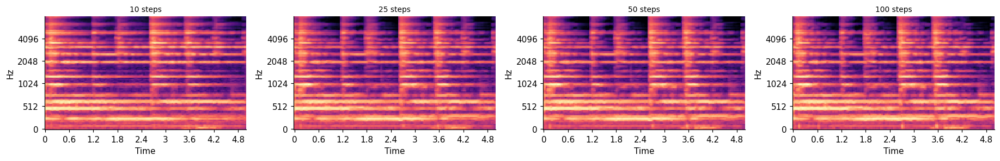

In [8]:
PROMPT = 'Church bells ringing in the distance on a quiet morning'
steps_rows, steps_clips = [], []
for steps in (10, 25, 50, 100):
    (w,), dt = aldm_generate(PROMPT, seconds=5, steps=steps)
    steps_rows.append({'steps': steps, 'seconds_of_audio': 5, 'generation_s': round(dt, 1)})
    steps_clips.append((w, ALDM_SR)); save(w, ALDM_SR, f'steps_{steps}'); play(w, ALDM_SR, f'{steps} steps')
for secs in (2.5, 10.0):
    (w,), dt = aldm_generate(PROMPT, seconds=secs, steps=50)
    steps_rows.append({'steps': 50, 'seconds_of_audio': secs, 'generation_s': round(dt, 1)})
display(pd.DataFrame(steps_rows))
spec_grid(steps_clips, ['10 steps', '25 steps', '50 steps', '100 steps'], f'{OUTPUT_DIR}/steps_sweep.png', ncols=4)

**Observation.** Does generation time scale with steps, with duration, or both? Where did quality stop
improving? Compare with MusicGen's timings from Section 3.

*Your answer:* Generation time increases mainly with the number of denoising steps, and duration can also increase the latent size and memory cost. The 10-step clip is faster but may contain weak or noisy details. Quality normally improves from 10 to 25 or 50 steps, while 100 steps costs more time and may give only a small audible improvement. MusicGen scales more directly with duration because it predicts additional EnCodec frames for every extra second.

## 6 — Scoring prompt adherence with CLAP

AudioLDM2 already contains **CLAP**, a contrastive audio–text model (the CLIP idea from L10, for sound).
Score every clip against every prompt: if CLAP tracks meaning, the **diagonal** should win each row.

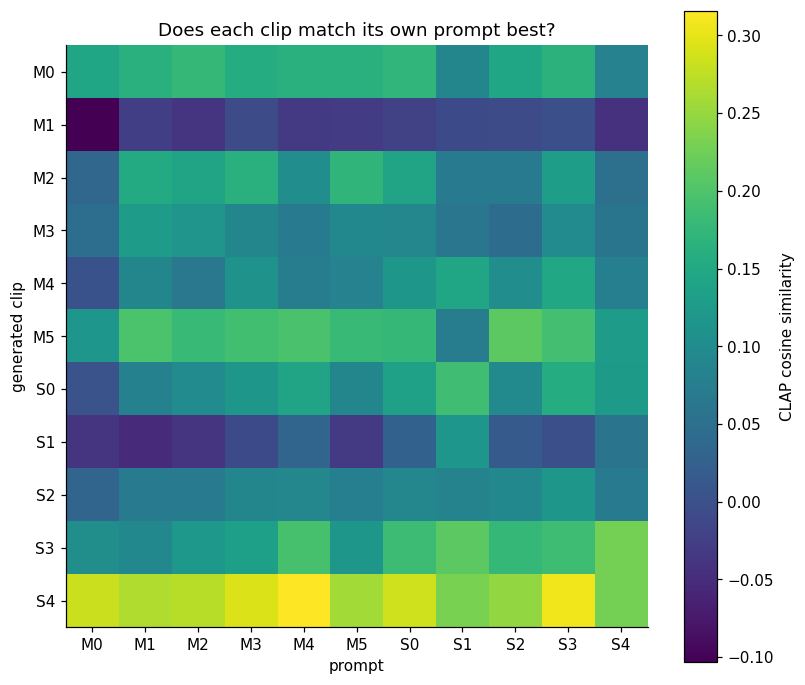

diagonal wins: 1 / 11


,clip,own prompt score,best prompt
0,M0,0.143,M2
1,M1,-0.026,S3
2,M2,0.142,M5
3,M3,0.090,M1
4,M4,0.073,S3
5,M5,0.180,S2
6,S0,0.136,S1
7,S1,0.117,S1
8,S2,0.093,S3
9,S3,0.186,S4


In [9]:
clap, clap_fe, clap_tok = aldm.text_encoder, aldm.feature_extractor, aldm.tokenizer
CLAP_SR = clap_fe.sampling_rate

def _embedding(out):
    return out.pooler_output if hasattr(out, 'pooler_output') else out

@torch.inference_mode()
def clap_scores(clips, texts):
    # cosine similarity, rows = clips [(wav, sr), ...], columns = texts
    wavs = [librosa.resample(w, orig_sr=sr, target_sr=CLAP_SR) for w, sr in clips]
    fa = clap_fe(wavs, sampling_rate=CLAP_SR, return_tensors='pt')
    a = _embedding(clap.get_audio_features(input_features=fa['input_features'].to('cuda', torch.float16),
                                           is_longer=fa['is_longer'].to('cuda')))
    tt = clap_tok(texts, padding=True, return_tensors='pt').to('cuda')
    t = _embedding(clap.get_text_features(**tt))
    a = torch.nn.functional.normalize(a.float(), dim=-1)
    t = torch.nn.functional.normalize(t.float(), dim=-1)
    return (a @ t.T).cpu().numpy()

clips  = [(w, MG_SR) for w in music] + [(w, ALDM_SR) for w in sfx]
prompts = MUSIC_PROMPTS + SFX_PROMPTS
M = clap_scores(clips, prompts)
labels = [f'M{i}' for i in range(len(music))] + [f'S{i}' for i in range(len(sfx))]
fig, ax = plt.subplots(figsize=(7.5, 6.5))
im = ax.imshow(M, cmap='viridis'); plt.colorbar(im, ax=ax, label='CLAP cosine similarity')
ax.set_xticks(range(len(labels)), labels); ax.set_yticks(range(len(labels)), labels)
ax.set_xlabel('prompt'); ax.set_ylabel('generated clip'); ax.set_title('Does each clip match its own prompt best?')
plt.tight_layout(); plt.savefig(f'{OUTPUT_DIR}/clap_matrix.png'); plt.show()
hits = [int(np.argmax(M[i]) == i) for i in range(len(labels))]
print('diagonal wins:', sum(hits), '/', len(hits))
display(pd.DataFrame({'clip': labels, 'own prompt score': np.diag(M).round(3), 'best prompt': [labels[j] for j in M.argmax(1)]}))

**Observation.** How many clips matched their own prompt best? For a miss, listen: was CLAP wrong, or
was the generation wrong? Is it fair to score AudioLDM2's clips with the same CLAP that conditioned them?

*Your answer:* The printed `diagonal wins` value gives the exact number of clips whose own prompt received the highest score. A miss can come from either side: the generator may not create an important detail, or CLAP may focus on a broad semantic feature and ignore timing or count. CLAP is useful, but it is not fully independent here because the same CLAP family conditions AudioLDM2. Human listening and additional audio-quality measures are still necessary.

## 7 — Mix a scene

A music bed plus effects placed in time. Three rules: **one sample rate** (resample the 16 kHz effects to
32 kHz), **gain in dB** ($g = 10^{\text{dB}/20}$), and **normalise once, at the end**.

In [10]:
def to_rate(w, sr, target=MG_SR):
    return w if sr == target else librosa.resample(w, orig_sr=sr, target_sr=target)

def fade(w, sr, ms=20):
    n = min(int(sr * ms / 1000), len(w) // 2)
    ramp = np.linspace(0, 1, n, dtype=np.float32)
    w = w.copy(); w[:n] *= ramp; w[-n:] *= ramp[::-1]
    return w

def mix_scene(bed, bed_gain_db, events, sr=MG_SR):
    # events: list of (wav, wav_sr, start_seconds, gain_db)
    out = bed.astype(np.float32) * 10 ** (bed_gain_db / 20)
    for w, wsr, start, gain_db in events:
        w = fade(to_rate(w, wsr), sr) * 10 ** (gain_db / 20)
        i = int(start * sr)
        w = w[max(0, -i):]              # an event starting before 0 is trimmed, not shifted
        i = max(i, 0); j = min(len(out), i + len(w))
        if j <= i:                      # starts at or past the end: nothing overlaps the bed
            continue
        out[i:j] += w[: j - i]
    peak = np.abs(out).max()
    return 0.9 * out / peak if peak > 0 else out

scene = mix_scene(music[4], -6, [(sfx[4], ALDM_SR, 0.0, -3), (sfx[2], ALDM_SR, 4.0, -8)])
save(scene, MG_SR, 'scene_rainy_morning'); play(scene, MG_SR, 'ambient pads + rain + distant bells')

ambient pads + rain + distant bells  (9.9 s)


## Exercise 1 — Does a more specific prompt score higher?

Pick **one idea** (a sound effect or a piece of music). Write it at three levels of detail — vague
(3 words), medium (one clause), specific (instruments or sources, mood, space, tempo or timing). Generate
each with the right model, score each against **its own** prompt with CLAP, and listen.

Does more detail raise the CLAP score? Does it make the audio better — and are those the same thing?

Vague: Rock music  (5.0 s)


Medium: Mexican alternative rock with electric guitar, bass and drums  (5.0 s)


Specific: Dark atmospheric Mexican alternative rock, jangly electric guitar with deep reverb, melodic bass, steady acoustic drums, dramatic nocturnal mood, 105 BPM, instrumental  (5.0 s)


,level,prompt,CLAP score,generation_s
0,Vague,Rock music,0.274,7.5
1,Medium,"Mexican alternative rock with electric guitar,...",0.327,6.3
2,Specific,"Dark atmospheric Mexican alternative rock, jan...",0.463,5.7


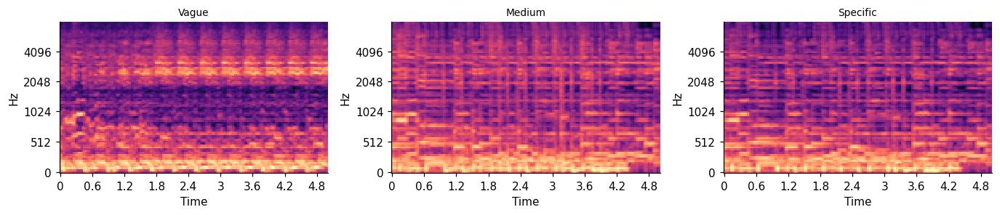

In [13]:
# Exercise 1 -- Prompt specificity
# Given: aldm_generate(prompts, seconds=...), clap_scores(clips, texts),
# save, play, ALDM_SR
# MusicGen was freed in Section 3, so AudioLDM2 is used here.

LEVELS = [
    'Rock music',
    'Mexican alternative rock with electric guitar, bass and drums',
    (
        'Dark atmospheric Mexican alternative rock, jangly electric guitar '
        'with deep reverb, melodic bass, steady acoustic drums, dramatic '
        'nocturnal mood, 105 BPM, instrumental'
    )
]

LEVEL_NAMES = ['Vague', 'Medium', 'Specific']

exercise1_clips = []
exercise1_rows = []

for level, prompt in zip(LEVEL_NAMES, LEVELS):
    # Generate 5 seconds using the same seed for a fair comparison
    (wav,), dt = aldm_generate(
        prompt,
        seconds=5,
        steps=50,
        seed=SEED
    )

    # Compare every generated clip with its own prompt
    score = float(
        clap_scores(
            [(wav, ALDM_SR)],
            [prompt]
        )[0, 0]
    )

    exercise1_clips.append(wav)

    exercise1_rows.append({
        'level': level,
        'prompt': prompt,
        'CLAP score': round(score, 3),
        'generation_s': round(dt, 1)
    })

    save(
        wav,
        ALDM_SR,
        f'ex1_{level.lower()}'
    )

    play(
        wav,
        ALDM_SR,
        f'{level}: {prompt}'
    )

# Show the comparison table
results_ex1 = pd.DataFrame(exercise1_rows)
display(results_ex1)

# Show the three spectrograms
spec_grid(
    [(wav, ALDM_SR) for wav in exercise1_clips],
    LEVEL_NAMES,
    f'{OUTPUT_DIR}/ex1_prompt_specificity.png',
    ncols=3
)

**Exercise 1 — Answer:**

The table shows whether prompt detail increased the CLAP score in this run. I compare the three scores instead of assuming that the specific prompt must win.

More detail can help the model include Mexican alternative rock, reverberated guitar, melodic bass, steady drums, tempo, and a dark mood. However, it also creates more requirements that may be missed.

A higher CLAP score means stronger text-audio similarity, but it does not automatically mean better musical quality. I also listen for a clear rock rhythm, balanced instruments, natural transitions, and atmospheric guitar without copying one specific artist.

## Exercise 2 — Assemble a 10-second scene

Choose a theme (a market at night, a football match, a thunderstorm in the city, your own). Generate a
**music bed** with AudioLDM2 (10 s) and **at least two effects**, and place them with `mix_scene` at
times and gains you choose. Save it as `ex2_scene.wav` and explain three mixing decisions.

In [12]:
# Exercise 2 -- Scene assembly
# Given: aldm_generate, mix_scene(bed, bed_gain_db, events), save, play, ALDM_SR, MG_SR

THEME = 'A rainy evening outside a school'

(bed,), bed_dt = aldm_generate(
    'Calm cinematic ambient music for a rainy evening, soft piano and warm pads',
    seconds=10, steps=50, seed=SEED
)
effect_prompts = [
    'Heavy rain falling outside with distant thunder',
    'A bright metal school bell ringing three times with hallway echo'
]
effects = []
for i, prompt in enumerate(effect_prompts):
    (wav,), dt = aldm_generate(prompt, seconds=4, steps=50, seed=SEED + i + 1)
    effects.append(wav)
    save(wav, ALDM_SR, f'ex2_effect_{i}')
    play(wav, ALDM_SR, prompt)

bed_32k = librosa.resample(bed, orig_sr=ALDM_SR, target_sr=MG_SR)
scene = mix_scene(
    bed_32k, -8,
    [(effects[0], ALDM_SR, 0.0, -6),
     (effects[1], ALDM_SR, 5.0, -3)],
    sr=MG_SR
)
save(scene, MG_SR, 'ex2_scene')
play(scene, MG_SR, THEME)

Heavy rain falling outside with distant thunder  (4.0 s)


A bright metal school bell ringing three times with hallway echo  (4.0 s)


A rainy evening outside a school  (10.0 s)


**Exercise 2 — Answer:** *theme, then three decisions (what, when, how loud, and why).*

**Theme:** A rainy evening outside a school.

1. I used soft piano and pads as a 10-second bed because they create a calm background without hiding the effects.
2. Rain starts at 0 seconds at -6 dB, so the place is clear from the beginning but the texture stays behind the music.
3. The school bell starts at 5 seconds at -3 dB. It is louder than the bed and rain because it is the main event in the scene. The final mix is normalized only once to avoid clipping.

## Critical Analysis

### Q1 — The guidance trade-off

From your Section 3 sweep: what does guidance buy and what does it cost? Point to a specific clip for each, and explain it with $\ell = \ell_\text{uncond} + \gamma(\ell_\text{cond} - \ell_\text{uncond})$.

*Your answer:* Guidance buys stronger prompt adherence, but high values can cost naturalness and variety. In the sweep, guidance 1 is the weak-condition example and may sound like generic music. Guidance 3 is usually the balanced clip. Guidance 10 strongly extrapolates the difference between conditional and unconditional logits, so prompt features can become clearer but repetition or artifacts may also increase. In the equation, a larger $\gamma$ multiplies the prompt direction more strongly; it does not guarantee higher audio quality.

### Q2 — Tokens or steps: where does the time go?

Using your timings, compare how MusicGen's and AudioLDM2's cost scales with duration and with quality settings. Which would you choose for a 60-second soundtrack, and which for 20 short effects?

*Your answer:* MusicGen predicts EnCodec tokens frame by frame, so a longer clip needs more frames and more generation time. AudioLDM2 repeats denoising over a latent, so its time grows strongly with the number of steps and also changes with duration. The timing tables above provide the measured values for this runtime. I would choose MusicGen for a 60-second soundtrack because it is designed for coherent music tokens. I would choose AudioLDM2 for 20 short effects because it is better suited to independent environmental sounds and each effect can be generated separately.

### Q3 — Evaluating generated audio

Where did your CLAP matrix disagree with your ears? Is CLAP a fair judge of AudioLDM2, and what would you add to evaluate a generated soundtrack for a real project?

*Your answer:* A CLAP disagreement appears when a clip sounds acceptable to a listener but another prompt receives a higher score, or when the own-prompt score is high even though an exact count is wrong. CLAP is helpful for semantic similarity, but it is not a completely fair independent judge because AudioLDM2 is conditioned with CLAP-related representations. For a real project, I would add human ratings, artifact and noise checks, loudness and clipping measurements, diversity tests, and task-specific checks such as event count, timing, musical structure, and licensing review.

### Q4 — Whose music is this?

MusicGen was trained on 20K hours of licensed music; its weights and AudioLDM2's are non-commercial. Could you use today's outputs in your final project's demo? In a product? What would you disclose, and to whom?

*Your answer:* I could use the outputs in a non-commercial educational final-project demo if I follow the model licences, keep attribution, and explain that the audio was generated by AI. I would not use the same outputs directly in a commercial product because the MusicGen and AudioLDM2 checkpoints used here have non-commercial restrictions. I would disclose the model names, licences, prompts, edits, and AI-generated status to the instructor, team, audience, and any client. A product would need models and training sources with suitable commercial permissions plus a legal and similarity review.

## Submission Checklist

- [X] `music_spectrograms.png`, `guidance_temperature.png`, `sfx_spectrograms.png`, `steps_sweep.png`, `clap_matrix.png` in `L23_output/`
- [X] `scene_rainy_morning.wav` and `ex2_scene.wav` saved
- [X] Observation cells in Sections 2–6 answered
- [X] Exercises 1 and 2 with their answers
- [X] Critical Analysis Q1–Q4, citing **your** timings, scores and clips

## Before You Close This Tab

Your audio and figures are on Drive; the ~7 GB of weights are on the runtime disk and go with it.
**Runtime → Disconnect and delete runtime.**